# Visualization of augmented imgaes

## Import

In [1]:
%load_ext autoreload
%autoreload

import numpy as np
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import os

from utils import join_path, rotate_image, plot_transforms, join_path_list

plt.style.use('dark_background')

## Data paths

In [2]:
dataset_path = r'C:\Users\jan\projects\tymbark_ase\original_data'
image_path = r'C:\Users\jan\projects\tymbark_ase\data_for_augumentation\cyt_mie'
image = 'train_cyt_mie_2.jpg'

## `ImageDataGenerator` - parameters

In [3]:
generator = ImageDataGenerator(
                featurewise_center=False,
                samplewise_center=False,
                featurewise_std_normalization=False,
                samplewise_std_normalization=False,
                zca_whitening=False,
                zca_epsilon=1e-06,
                rotation_range=0,
                width_shift_range=0.0,
                height_shift_range=0.0,
                brightness_range=None,
                shear_range=0,
                zoom_range=0.0,
                channel_shift_range=0,
                fill_mode='constant',
                cval=np.random.randint(0, 256, 1)[0],
                horizontal_flip=False,
                vertical_flip=False,
                rescale=None,
                preprocessing_function=None,
                data_format=None,
                validation_split=0.0,
                dtype=None)

## Reading an image to `np.array`

In [4]:
target_shape = [512, 512]

img = load_img(join_path(image_path, image))
img = img.resize(target_shape)
img = np.array(img)
# img need to be rotated in oreder to be in vertical positon
#img = rotate_image(image_path=False, image_array=img, rotations=3)

### Image to work with

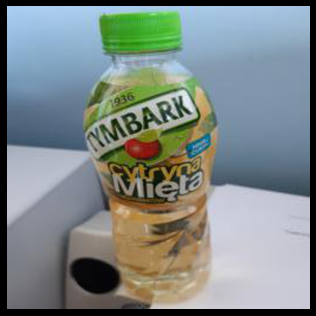

In [5]:
fig, ax = plt.subplots(figsize=[4.5, 4.5])

ax.imshow(img)
ax.axis('off')

plt.tight_layout()
plt.show()

## Plotiong random transformations

### Random rotations

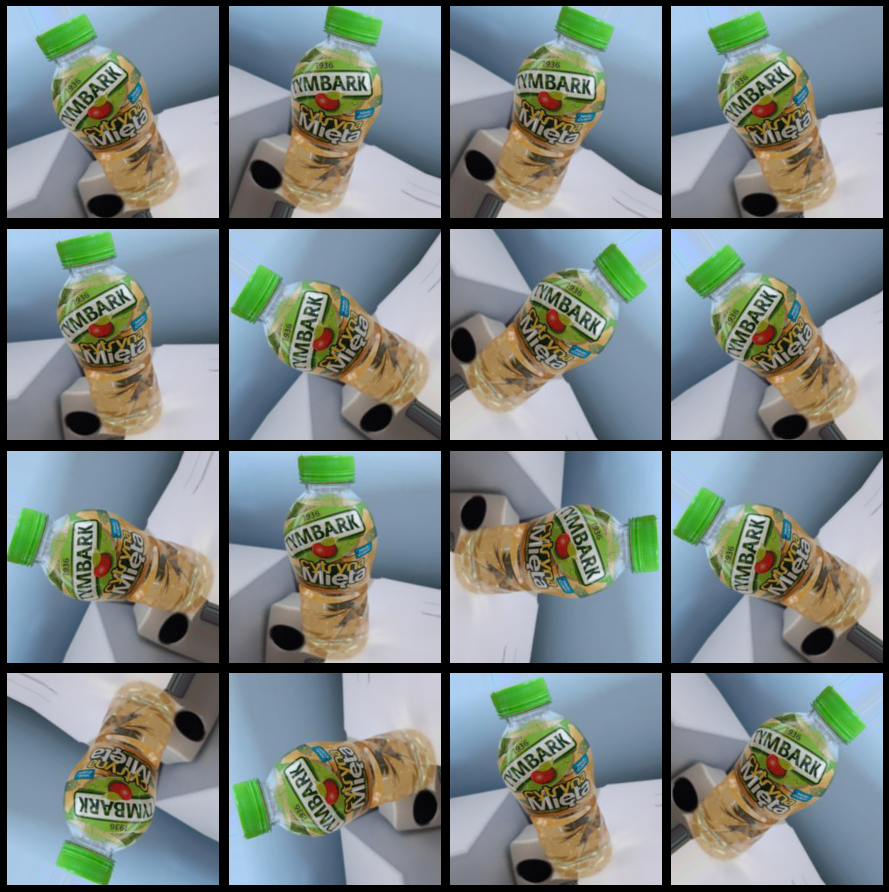

In [7]:
params = [30, 60, 90, 180]
generators = [ImageDataGenerator(rotation_range=p) for p in params]

plot_transforms(generators, img)

### Width shift

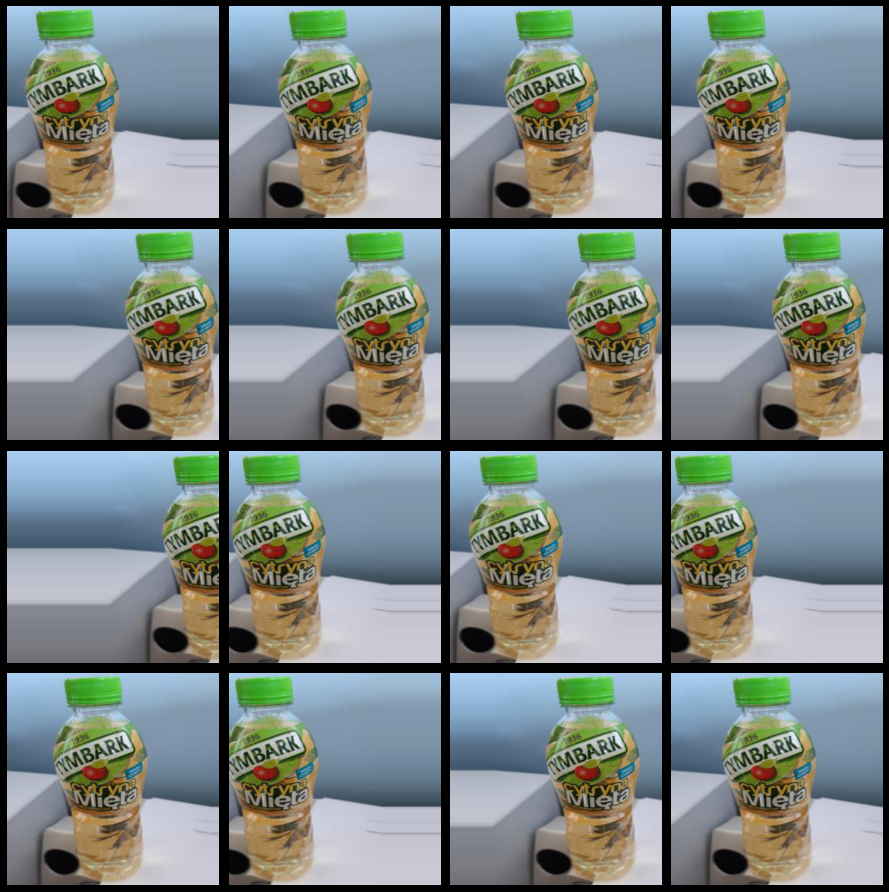

In [9]:
params = [0.2, 0.4, 0.6, 0.8]
generators = [ImageDataGenerator(width_shift_range=p) for p in params]

plot_transforms(generators, img)

### Height shift

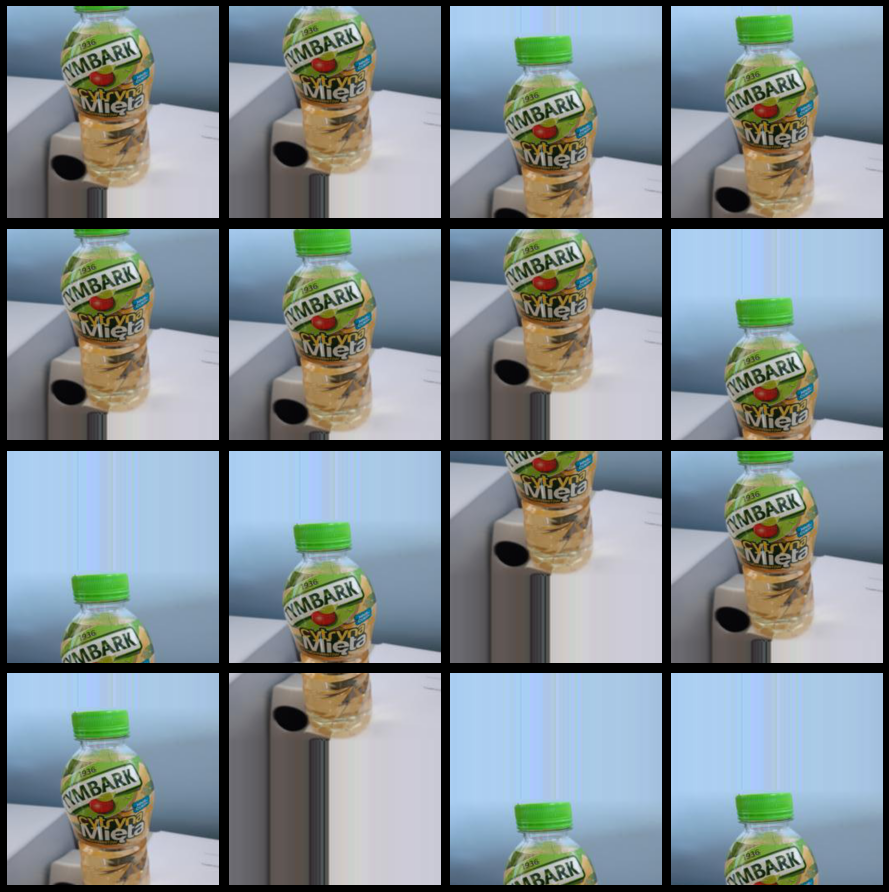

In [10]:
params = [0.2, 0.4, 0.6, 0.8]
generators = [ImageDataGenerator(height_shift_range=p) for p in params]

plot_transforms(generators, img)

### Fill mode, color of constant fill

#### Fill mode

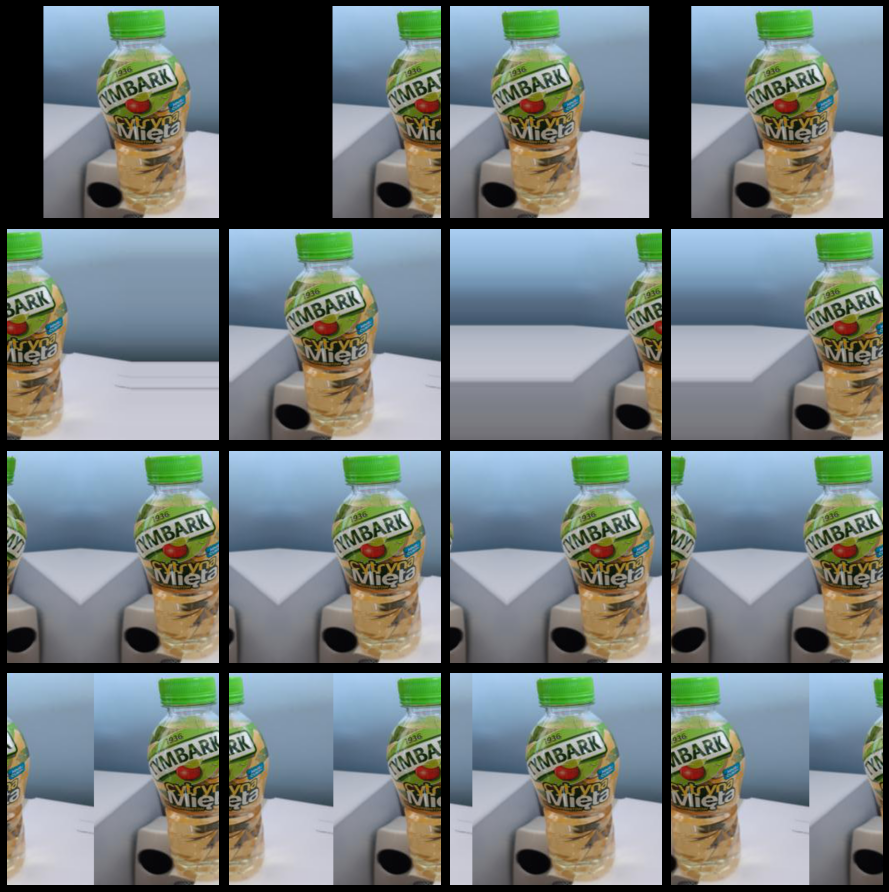

In [11]:
params = ['constant', 'nearest', 'reflect', 'wrap']

generators = [ImageDataGenerator(
                width_shift_range=0.6,
                fill_mode=p) for p in params]

plot_transforms(generators, img)

#### Color of fill

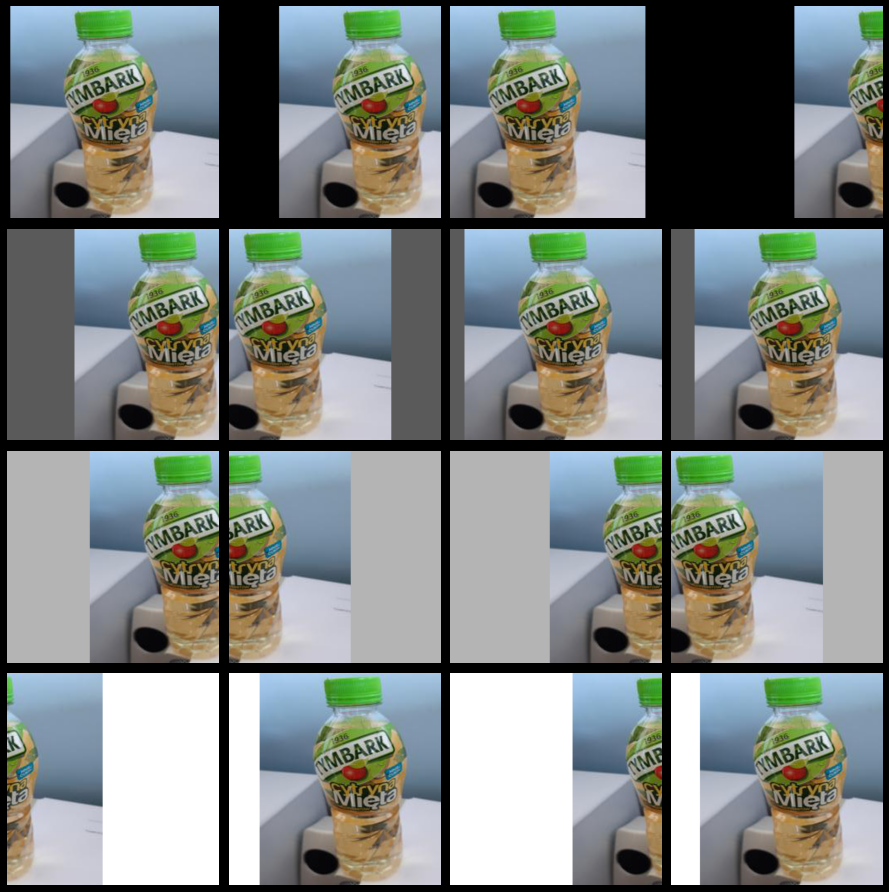

In [12]:
params = [0, 90, 180, 255]

generators = [ImageDataGenerator(
                width_shift_range=0.6,
                fill_mode='constant', cval=p) for p in params]

plot_transforms(generators, img)

### Brightness range

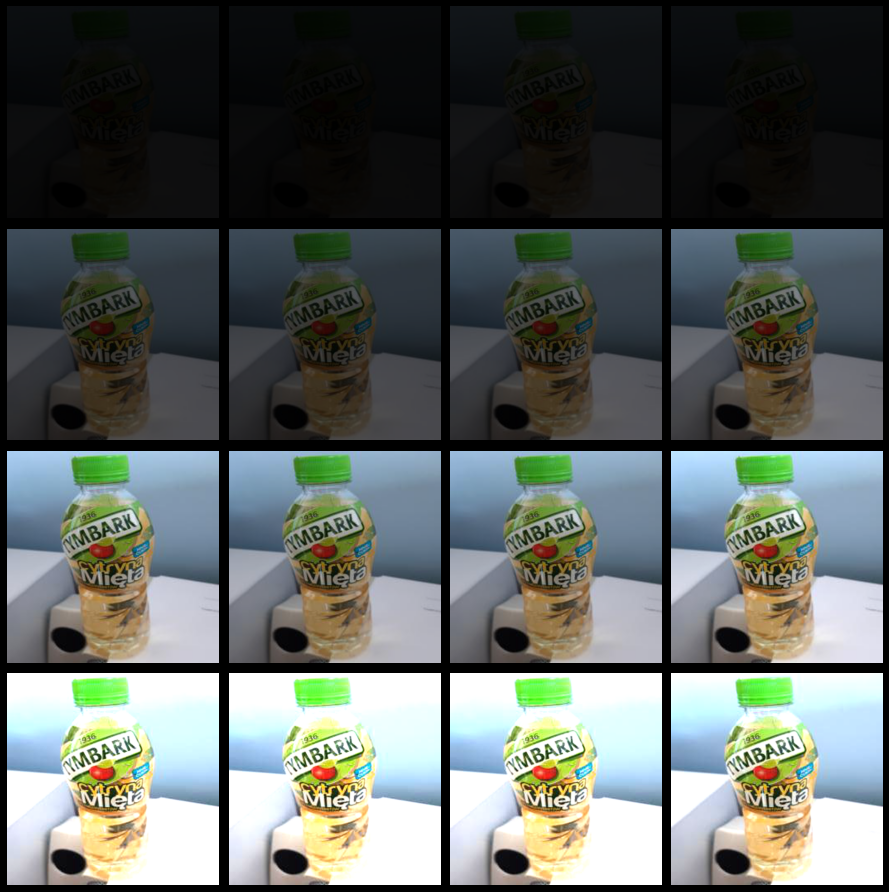

In [14]:
params = [(0.00, 0.35), (0.35, 0.60), (0.80, 1.20), (1.50, 2.00)]
generators = [ImageDataGenerator(brightness_range=p) for p in params]

plot_transforms(generators, img)

### Shear range

In [21]:
params = [15, 60, 90, 180]
generators = [ImageDataGenerator(shear_range=p) for p in params]

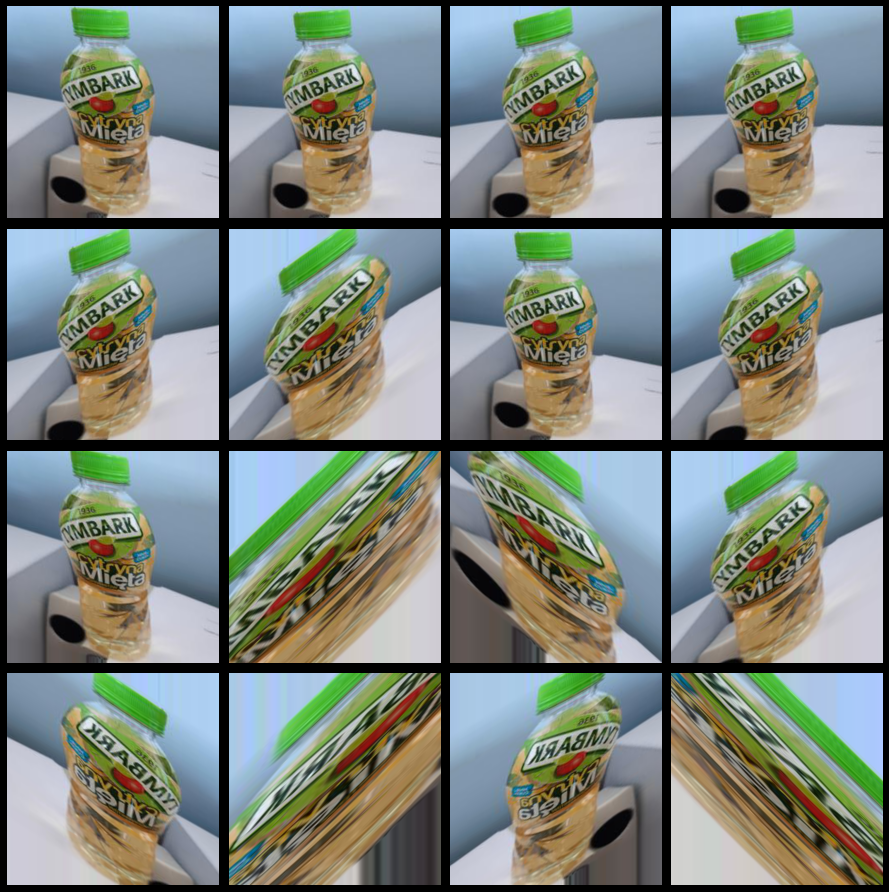

In [22]:
plot_transforms(generators, img)

### Zoom range

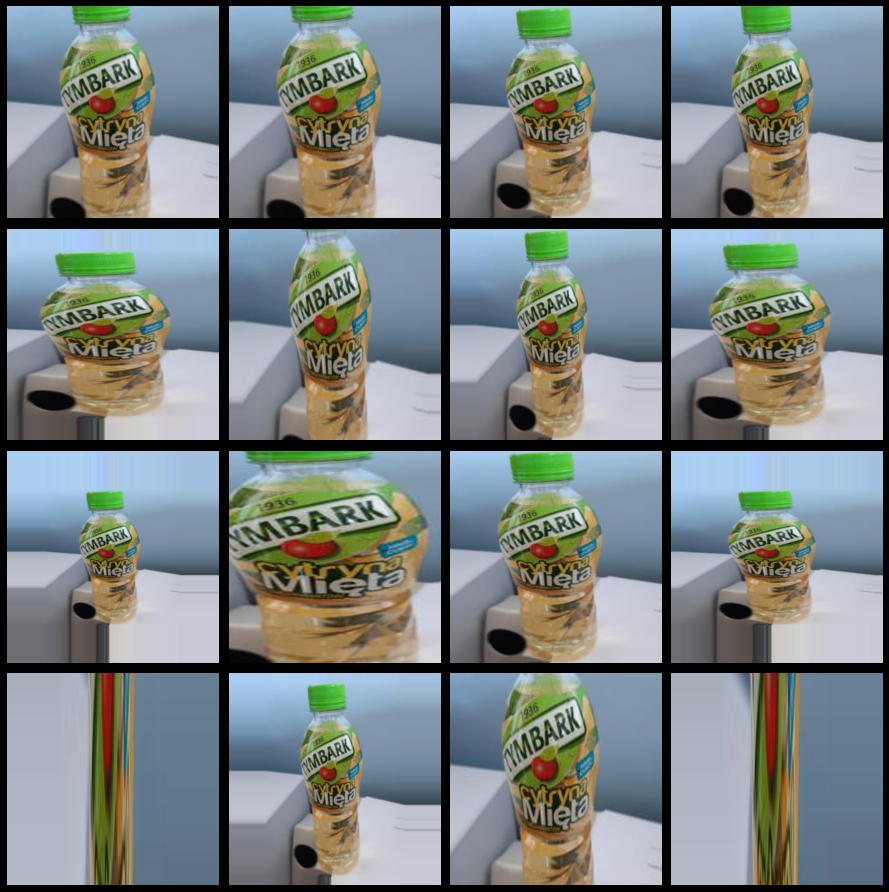

In [25]:
params = [0.2, 0.4, 0.6, 1.0]
gens = [ImageDataGenerator(zoom_range=p) for p in params]

plot_transforms(gens, img)

### Channel shift range

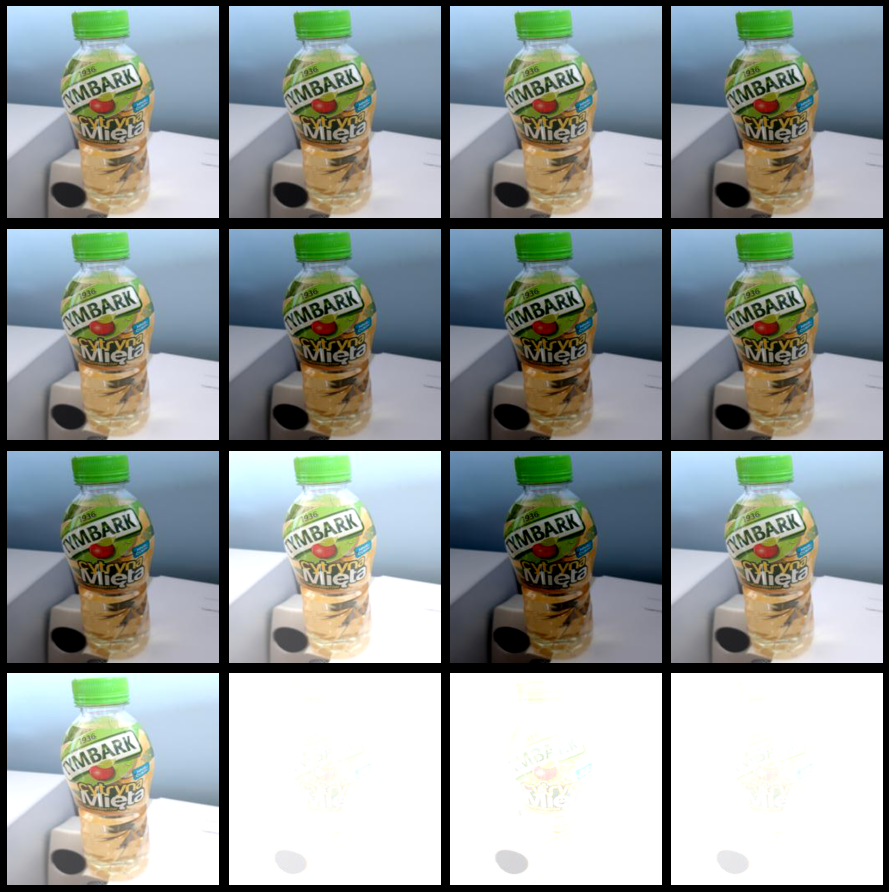

In [27]:
params = [30, 60, 80, 255]
gens = [ImageDataGenerator(channel_shift_range=p) for p in params]

plot_transforms(gens, img)

### Horizonatal flip

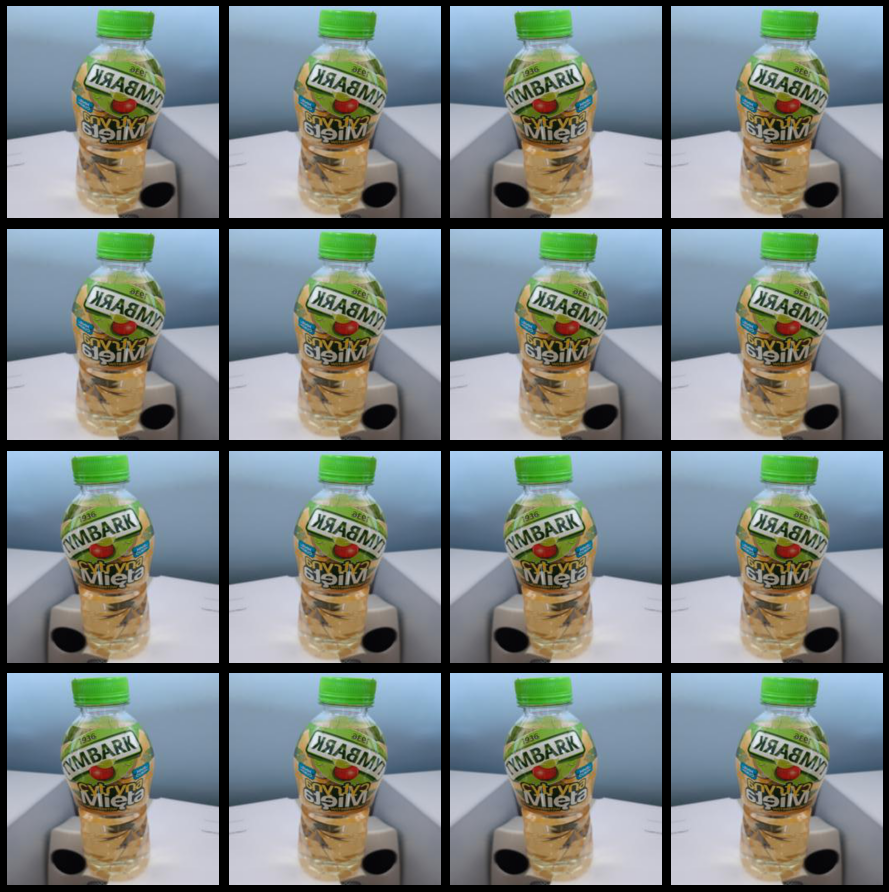

In [28]:
params = [True, True, True, True]
gens = [ImageDataGenerator(horizontal_flip=p) for p in params]

plot_transforms(gens, img)

### Vertical flip

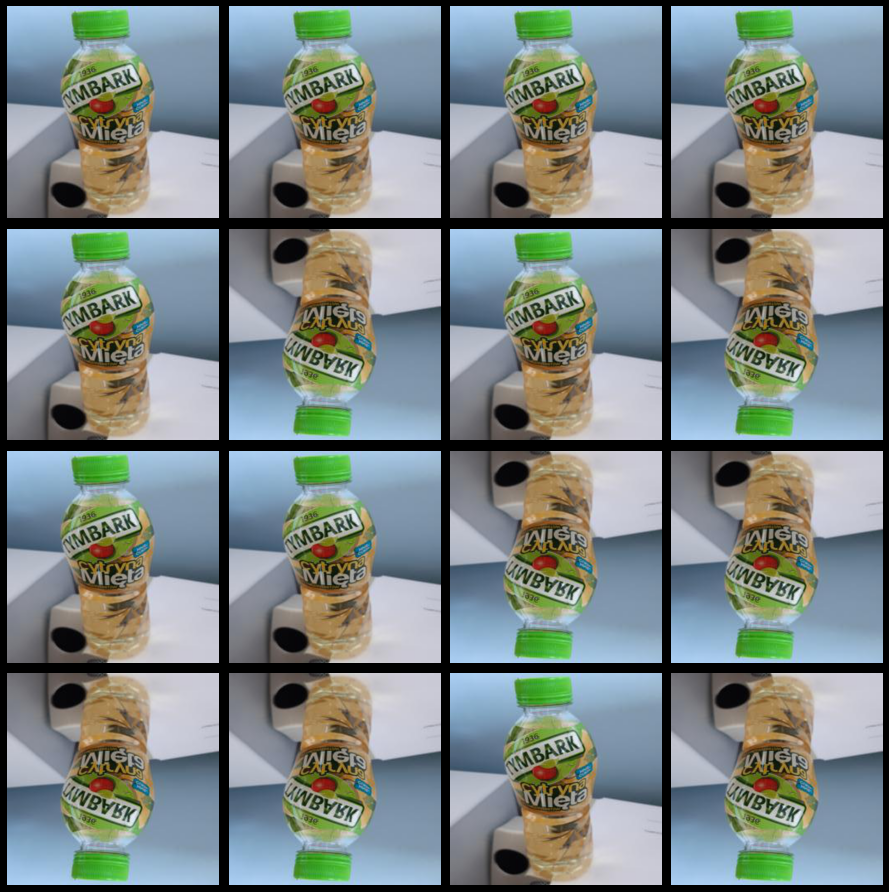

In [29]:
params = [1, 1, 1, 1]
gens = [ImageDataGenerator(vertical_flip=p) for p in params]

plot_transforms(gens, img)

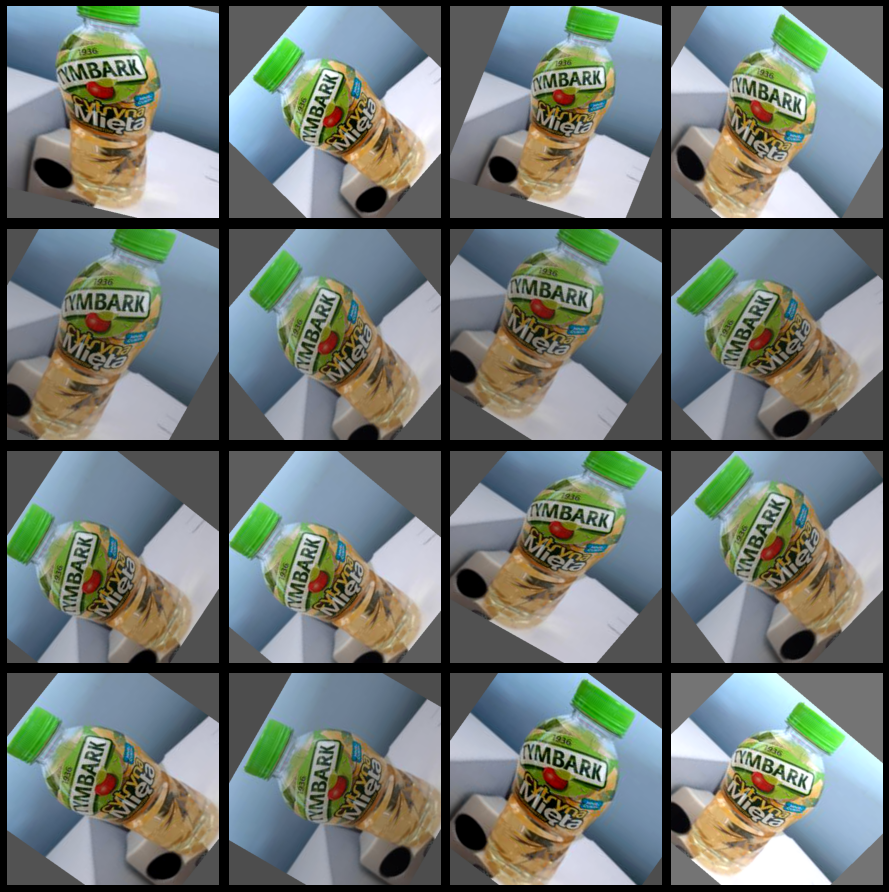

In [33]:
params = [1, 1, 1, 1]
gens = [ImageDataGenerator(
        rescale=1/255,
        rotation_range=60,
        width_shift_range=0.1,
        height_shift_range=0.1,
        fill_mode='constant',
        cval=90,
        brightness_range=(0.80, 1.20),
        shear_range=10,
        zoom_range=0.1,
        channel_shift_range=30,
        zca_whitening=False,
        horizontal_flip=False,
        vertical_flip=False) for p in params]

plot_transforms(gens, img)